In [2]:
#Import Required Python Packages and read data
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno # To visualize missing value
import plotly.graph_objects as go # To Generate Graphs
import plotly.express as px # To Generate box plot for statistical representation
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

In [60]:
df = pd.read_csv(r"https://raw.githubusercontent.com/jacklong233/ST1/main/Rice_MSC_Dataset_Trimmed.csv")

In [59]:
df.head()

,AREA,PERIMETER,MAJOR_AXIS,MINOR_AXIS,ECCENTRICITY,EQDIASQ,SOLIDITY,CONVEX_AREA,EXTENT,ASPECT_RATIO,ROUNDNESS,COMPACTNESS,SHAPEFACTOR_1,SHAPEFACTOR_2,SHAPEFACTOR_3,SHAPEFACTOR_4,CLASS
0,7805,437.915,209.8215,48.0221,0.9735,99.6877,0.9775,7985,0.3547,4.3693,0.5114,0.4751,0.0269,0.0062,0.2257,0.9863,Basmati
1,7503,340.757,138.3361,69.8417,0.8632,97.7400,0.9660,7767,0.6637,1.9807,0.8120,0.7065,0.0184,0.0093,0.4992,0.9888,Arborio
2,5124,314.617,141.9803,46.5784,0.9447,80.7718,0.9721,5271,0.4760,3.0482,0.6505,0.5689,0.0277,0.0091,0.3236,0.9865,Jasmine
3,7990,437.085,201.4386,51.2245,0.9671,100.8622,0.9659,8272,0.6274,3.9325,0.5256,0.5007,0.0252,0.0064,0.2507,0.9859,Basmati
4,7433,342.893,140.3350,68.3927,0.8732,97.2830,0.9831,7561,0.6006,2.0519,0.7944,0.6932,0.0189,0.0092,0.4806,0.9860,Arborio


In [61]:
df.tail()

,AREA,PERIMETER,MAJOR_AXIS,MINOR_AXIS,ECCENTRICITY,EQDIASQ,SOLIDITY,CONVEX_AREA,EXTENT,ASPECT_RATIO,ROUNDNESS,COMPACTNESS,SHAPEFACTOR_1,SHAPEFACTOR_2,SHAPEFACTOR_3,SHAPEFACTOR_4,CLASS
74995,5551,285.911,114.1695,62.9079,0.8345,84.0699,0.9846,5638,0.6418,1.8149,0.8533,0.7364,0.0206,0.0113,0.5422,0.9841,Arborio
74996,7696,322.703,121.3900,81.1375,0.7438,98.9892,0.9868,7799,0.7309,1.4961,0.9287,0.8155,0.0158,0.0105,0.6650,0.9949,Karacadag
74997,7579,339.295,136.3125,71.2866,0.8524,98.2338,0.9805,7730,0.6399,1.9122,0.8273,0.7207,0.0180,0.0094,0.5193,0.9931,Arborio
74998,15174,489.502,200.9486,97.6282,0.8740,138.9969,0.9766,15537,0.7903,2.0583,0.7958,0.6917,0.0132,0.0064,0.4785,0.9848,Ipsala
74999,12931,452.635,185.5138,90.2651,0.8736,128.3131,0.9760,13249,0.7640,2.0552,0.7931,0.6917,0.0143,0.0070,0.4784,0.9832,Ipsala


In [62]:
df.CLASS.value_counts()

CLASS
Basmati      15000
Arborio      15000
Jasmine      15000
Ipsala       15000
Karacadag    15000
Name: count, dtype: int64

In [10]:
df.shape

(75000, 17)

In [11]:
df.columns

Index(['AREA', 'PERIMETER', 'MAJOR_AXIS', 'MINOR_AXIS', 'ECCENTRICITY',
       'EQDIASQ', 'SOLIDITY', 'CONVEX_AREA', 'EXTENT', 'ASPECT_RATIO',
       'ROUNDNESS', 'COMPACTNESS', 'SHAPEFACTOR_1', 'SHAPEFACTOR_2',
       'SHAPEFACTOR_3', 'SHAPEFACTOR_4', 'CLASS'],
      dtype='object')

In [12]:
df.nunique()

AREA             10793
PERIMETER        57459
MAJOR_AXIS       71629
MINOR_AXIS       67873
ECCENTRICITY      3026
EQDIASQ          10793
SOLIDITY           588
CONVEX_AREA      11069
EXTENT            5464
ASPECT_RATIO     26437
ROUNDNESS         5247
COMPACTNESS       4291
SHAPEFACTOR_1      247
SHAPEFACTOR_2       84
SHAPEFACTOR_3     5411
SHAPEFACTOR_4      544
CLASS                5
dtype: int64

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 75000 entries, 0 to 74999
Data columns (total 17 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   AREA           75000 non-null  int64  
 1   PERIMETER      75000 non-null  float64
 2   MAJOR_AXIS     75000 non-null  float64
 3   MINOR_AXIS     75000 non-null  float64
 4   ECCENTRICITY   75000 non-null  float64
 5   EQDIASQ        75000 non-null  float64
 6   SOLIDITY       75000 non-null  float64
 7   CONVEX_AREA    75000 non-null  int64  
 8   EXTENT         75000 non-null  float64
 9   ASPECT_RATIO   75000 non-null  float64
 10  ROUNDNESS      75000 non-null  float64
 11  COMPACTNESS    75000 non-null  float64
 12  SHAPEFACTOR_1  75000 non-null  float64
 13  SHAPEFACTOR_2  75000 non-null  float64
 14  SHAPEFACTOR_3  75000 non-null  float64
 15  SHAPEFACTOR_4  75000 non-null  float64
 16  CLASS          75000 non-null  object 
dtypes: float64(14), int64(2), object(1)
memory usage: 

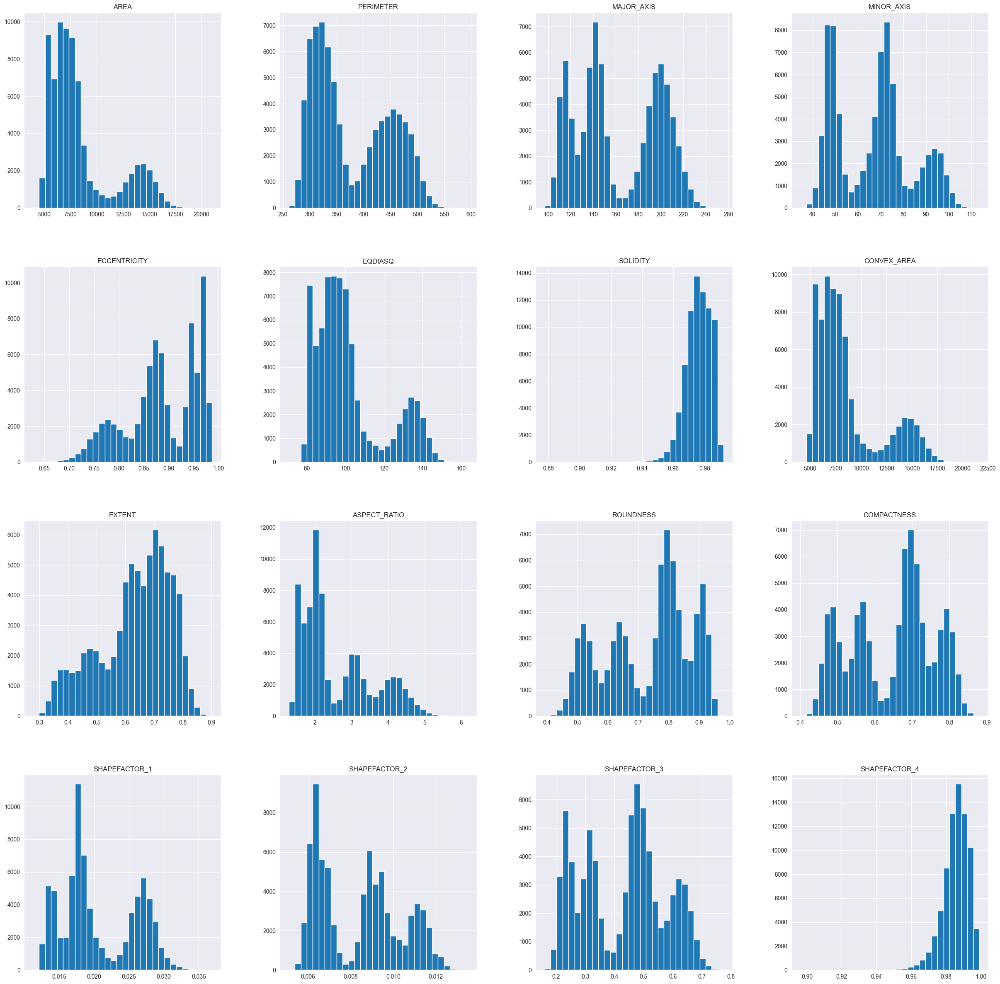

In [14]:
#3. Visualising data  distribution in detail
fig = plt.figure(figsize =(30,30))
ax=fig.gca()
df.hist(ax=ax,bins =30)
plt.show()

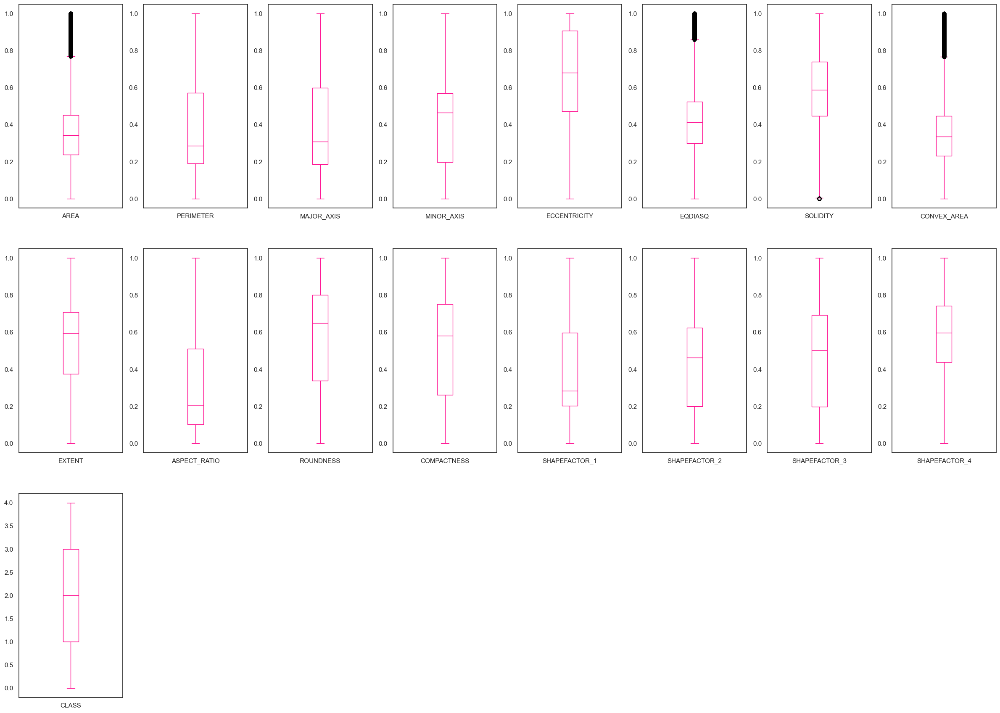

In [57]:
#detecting outliers and remove them
df.plot(kind='box', subplots=True,
        layout=(20,8),sharex=False,sharey=False, figsize=(30, 150), color='deeppink');

In [16]:
#identify the outliers
# define continuous variable & plot
continous_features = ['AREA', 'PERIMETER', 'MAJOR_AXIS', 'MINOR_AXIS', 'ECCENTRICITY', 'EQDIASQ', 'SOLIDITY', 'CONVEX_AREA', 'EXTENT', 'ASPECT_RATIO', 'ROUNDNESS', 'COMPACTNESS', 'SHAPEFACTOR_1','SHAPEFACTOR_2','SHAPEFACTOR_3','SHAPEFACTOR_4']
def outliers(df_out, drop = False):
    for each_feature in df_out.columns:
        feature_data = df_out[each_feature]
        Q1 = np.percentile(feature_data, 25.) # 25th percentile of the data of the given feature
        Q3 = np.percentile(feature_data, 75.) # 75th percentile of the data of the given feature
        IQR = Q3-Q1 #Interquartile Range
        outlier_step = IQR * 1.5 #That's we were talking about above
        outliers = feature_data[~((feature_data >= Q1 - outlier_step) & (feature_data <= Q3 + outlier_step))].index.tolist()
        if not drop:
            print('For the feature {}, No of Outliers is {}'.format(each_feature, len(outliers)))
        if drop:
            df.drop(outliers, inplace = True, errors = 'ignore')
            print('Outliers from {} feature removed'.format(each_feature))

outliers(df[continous_features])

For the feature AREA, No of Outliers is 11986
For the feature PERIMETER, No of Outliers is 0
For the feature MAJOR_AXIS, No of Outliers is 0
For the feature MINOR_AXIS, No of Outliers is 0
For the feature ECCENTRICITY, No of Outliers is 140
For the feature EQDIASQ, No of Outliers is 9165
For the feature SOLIDITY, No of Outliers is 722
For the feature CONVEX_AREA, No of Outliers is 11569
For the feature EXTENT, No of Outliers is 49
For the feature ASPECT_RATIO, No of Outliers is 113
For the feature ROUNDNESS, No of Outliers is 0
For the feature COMPACTNESS, No of Outliers is 0
For the feature SHAPEFACTOR_1, No of Outliers is 0
For the feature SHAPEFACTOR_2, No of Outliers is 0
For the feature SHAPEFACTOR_3, No of Outliers is 0
For the feature SHAPEFACTOR_4, No of Outliers is 1716


In [17]:
outliers(df[continous_features], drop = True)

Outliers from AREA feature removed
Outliers from PERIMETER feature removed
Outliers from MAJOR_AXIS feature removed
Outliers from MINOR_AXIS feature removed
Outliers from ECCENTRICITY feature removed
Outliers from EQDIASQ feature removed
Outliers from SOLIDITY feature removed
Outliers from CONVEX_AREA feature removed
Outliers from EXTENT feature removed
Outliers from ASPECT_RATIO feature removed
Outliers from ROUNDNESS feature removed
Outliers from COMPACTNESS feature removed
Outliers from SHAPEFACTOR_1 feature removed
Outliers from SHAPEFACTOR_2 feature removed
Outliers from SHAPEFACTOR_3 feature removed
Outliers from SHAPEFACTOR_4 feature removed


In [18]:
#rows and columns-data shape after removal of outliers
df.shape

(60827, 17)

In [19]:
df.CLASS.value_counts()

CLASS
Arborio      14930
Karacadag    14859
Jasmine      14350
Basmati      13696
Ipsala        2992
Name: count, dtype: int64

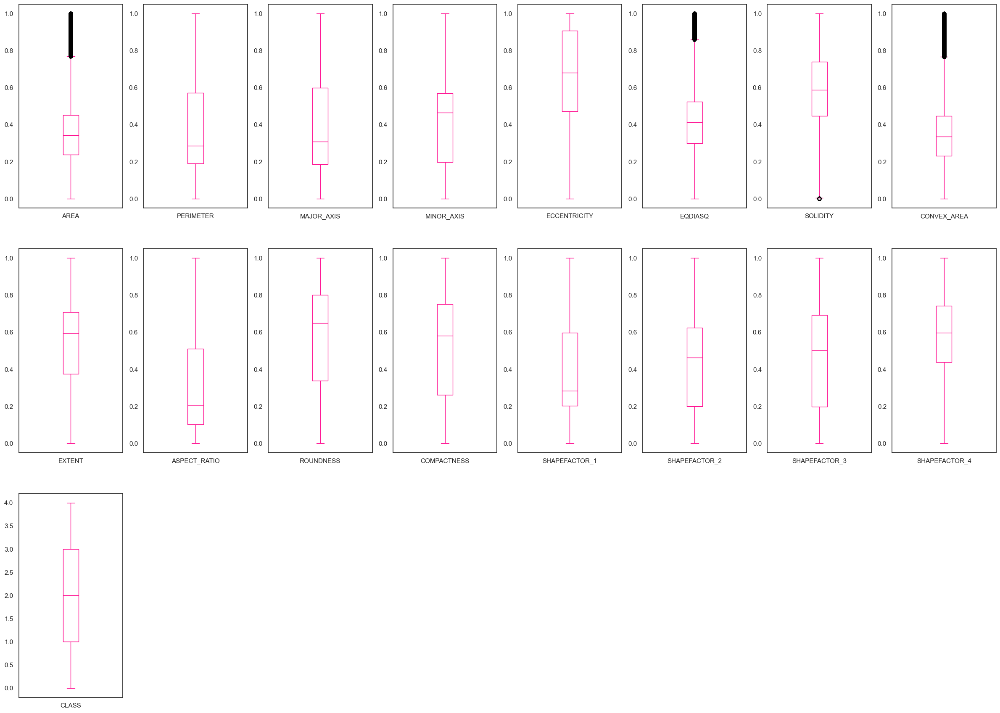

In [54]:
#check if outliers got removed
df.plot(kind='box', subplots=True,
        layout=(20,8),sharex=False,sharey=False, figsize=(30, 150), color='deeppink');

CLASS
0.0    14930
4.0    14859
3.0    14350
1.0    13696
2.0     2992
Name: count, dtype: int64


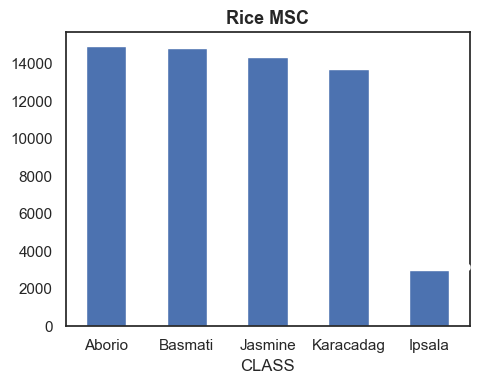

In [55]:
#target value distribution
print(df.CLASS.value_counts())


fig, ax = plt.subplots(figsize=(5,4))
name = ["Aborio", "Basmati", "Jasmine", "Karacadag", "Ipsala"]
ax = df.CLASS.value_counts().plot(kind='bar')
ax.set_title("Rice MSC", fontsize = 13, weight = 'bold')
ax.set_xticklabels (name, rotation = 0)

# To calculate the percentage
totals = []
for i in ax.patches:
    totals.append(i.get_height())
total = sum(totals)
for i in ax.patches:
    ax.text(i.get_x()+.09, i.get_height()-50,
            str(round((i.get_height()/total)*100, 2))+'%', fontsize=14,
                color='white', weight = 'bold')

plt.tight_layout()

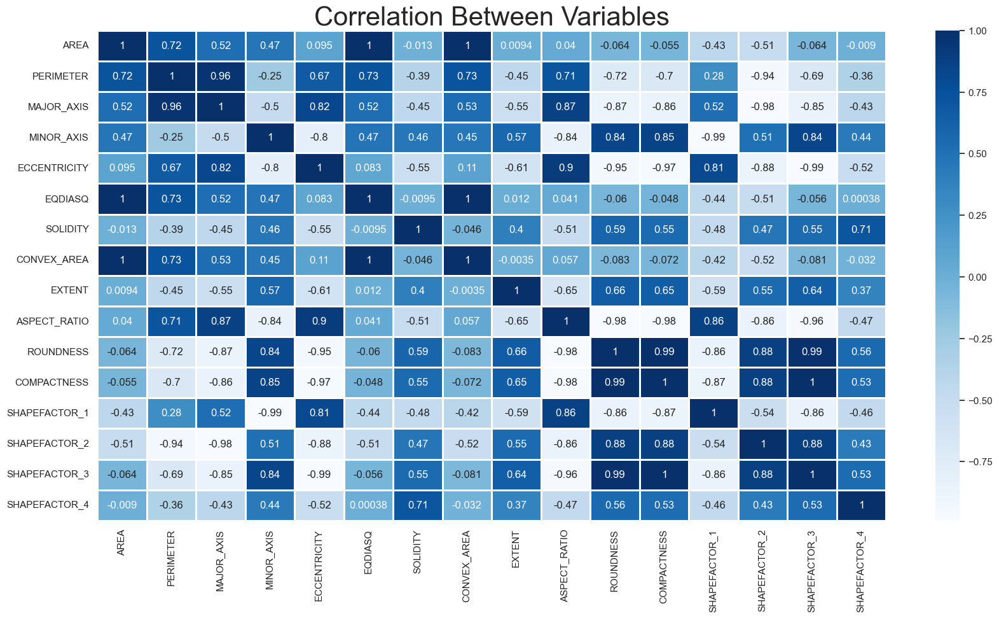

In [56]:
#check correlation between variables
sns.set(style="white")
plt.rcParams['figure.figsize'] = (20, 10)
sns.heatmap(df.iloc[:, :-1].corr(), annot = True, linewidths=1, cmap="Blues")
plt.title('Correlation Between Variables', fontsize = 30)
plt.show()

In [ ]:
#obtain full profiler report
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

In [23]:
import pandas as pd
import numpy as np
from pandas_profiling import ProfileReport

In [24]:
profile = ProfileReport(df,title="Rice MSC",
                        html={'style':{'full_width':True}})


In [59]:
profile.to_notebook_iframe()
 

In [31]:
profile.to_file(r"C:\Users\61430\PycharmProjects\pythonProject\Rice_MSC_Report")


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [25]:
from sklearn.exceptions import DataDimensionalityWarning
#encode object columns to integers
from sklearn import preprocessing
from sklearn.preprocessing import OrdinalEncoder

for col in df:
  if df[col].dtype =='object':
    df[col]=OrdinalEncoder().fit_transform(df[col].values.reshape(-1,1))
df

,AREA,PERIMETER,MAJOR_AXIS,MINOR_AXIS,ECCENTRICITY,EQDIASQ,SOLIDITY,CONVEX_AREA,EXTENT,ASPECT_RATIO,ROUNDNESS,COMPACTNESS,SHAPEFACTOR_1,SHAPEFACTOR_2,SHAPEFACTOR_3,SHAPEFACTOR_4,CLASS
0,7805,437.915,209.8215,48.0221,0.9735,99.6877,0.9775,7985,0.3547,4.3693,0.5114,0.4751,0.0269,0.0062,0.2257,0.9863,1.0
1,7503,340.757,138.3361,69.8417,0.8632,97.7400,0.9660,7767,0.6637,1.9807,0.8120,0.7065,0.0184,0.0093,0.4992,0.9888,0.0
2,5124,314.617,141.9803,46.5784,0.9447,80.7718,0.9721,5271,0.4760,3.0482,0.6505,0.5689,0.0277,0.0091,0.3236,0.9865,3.0
3,7990,437.085,201.4386,51.2245,0.9671,100.8622,0.9659,8272,0.6274,3.9325,0.5256,0.5007,0.0252,0.0064,0.2507,0.9859,1.0
4,7433,342.893,140.3350,68.3927,0.8732,97.2830,0.9831,7561,0.6006,2.0519,0.7944,0.6932,0.0189,0.0092,0.4806,0.9860,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74993,7812,416.943,196.3553,51.5025,0.9650,99.7324,0.9829,7948,0.3902,3.8125,0.5647,0.5079,0.0251,0.0066,0.2580,0.9836,1.0
74994,6230,289.151,108.7937,73.5588,0.7368,89.0634,0.9869,6313,0.7733,1.4790,0.9364,0.8186,0.0175,0.0118,0.6702,0.9912,4.0
74995,5551,285.911,114.1695,62.9079,0.8345,84.0699,0.9846,5638,0.6418,1.8149,0.8533,0.7364,0.0206,0.0113,0.5422,0.9841,0.0
74996,7696,322.703,121.3900,81.1375,0.7438,98.9892,0.9868,7799,0.7309,1.4961,0.9287,0.8155,0.0158,0.0105,0.6650,0.9949,4.0


In [26]:
class_label =df['CLASS']
df = df.drop(['CLASS'], axis =1)
df = (df-df.min())/(df.max()-df.min())
df['CLASS']=class_label
df

,AREA,PERIMETER,MAJOR_AXIS,MINOR_AXIS,ECCENTRICITY,EQDIASQ,SOLIDITY,CONVEX_AREA,EXTENT,ASPECT_RATIO,ROUNDNESS,COMPACTNESS,SHAPEFACTOR_1,SHAPEFACTOR_2,SHAPEFACTOR_3,SHAPEFACTOR_4,CLASS
0,0.433800,0.672910,0.748856,0.183046,0.971975,0.505819,0.616798,0.426383,0.074137,0.771000,0.164684,0.105024,0.610619,0.1125,0.074351,0.590323,1.0
1,0.400000,0.303278,0.274503,0.524567,0.595010,0.471799,0.314961,0.402869,0.597156,0.154953,0.714730,0.658612,0.234513,0.5000,0.585279,0.670968,0.0
2,0.133744,0.203830,0.298684,0.160449,0.873548,0.175419,0.475066,0.133643,0.279452,0.430274,0.419213,0.329426,0.646018,0.4750,0.257239,0.596774,3.0
3,0.454505,0.669752,0.693229,0.233170,0.950103,0.526334,0.312336,0.457340,0.535714,0.658345,0.190668,0.166268,0.535398,0.1375,0.121054,0.577419,1.0
4,0.392166,0.311405,0.287767,0.501888,0.629187,0.463817,0.763780,0.380649,0.490352,0.173316,0.682525,0.626794,0.256637,0.4875,0.550532,0.580645,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74993,0.434583,0.593123,0.659498,0.237521,0.942925,0.506600,0.758530,0.422392,0.134225,0.627395,0.262214,0.183493,0.530973,0.1625,0.134691,0.503226,1.0
74994,0.257527,0.106947,0.078469,0.582748,0.163021,0.320247,0.863517,0.246036,0.782668,0.025559,0.942360,0.926794,0.194690,0.8125,0.904726,0.748387,4.0
74995,0.181533,0.094620,0.114141,0.416039,0.496924,0.233026,0.803150,0.173228,0.560088,0.112191,0.790302,0.730144,0.331858,0.7500,0.665608,0.519355,0.0
74996,0.421600,0.234593,0.162054,0.701370,0.186945,0.493619,0.860892,0.406321,0.710900,0.029969,0.928271,0.919378,0.119469,0.6500,0.895012,0.867742,4.0


In [27]:
#Data Preprocessing
import sklearn
from sklearn import linear_model, preprocessing
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import accuracy_score
from sklearn.pipeline import Pipeline
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier

In [28]:
rice_data = df.copy()
le = preprocessing.LabelEncoder()
area = le.fit_transform(list(rice_data["AREA"]))
perimete = le.fit_transform(list(rice_data["PERIMETER"]))
major_axis = le.fit_transform(list(rice_data["MAJOR_AXIS"])) 
minor_axis = le.fit_transform(list(rice_data["MINOR_AXIS"])) 
eccentricity = le.fit_transform(list(rice_data["ECCENTRICITY"])) 
eqdiasq = le.fit_transform(list(rice_data["EQDIASQ"])) 
solidity = le.fit_transform(list(rice_data["SOLIDITY"])) 
convex_area = le.fit_transform(list(rice_data["CONVEX_AREA"])) 
extent = le.fit_transform(list(rice_data["EXTENT"])) 
aspect_ratio = le.fit_transform(list(rice_data["ASPECT_RATIO"])) 
roundness = le.fit_transform(list(rice_data["ROUNDNESS"])) 
compactness = le.fit_transform(list(rice_data["COMPACTNESS"])) 
shapefactor_1 = le.fit_transform(list(rice_data["SHAPEFACTOR_1"])) 
shapefactor_2 = le.fit_transform(list(rice_data["SHAPEFACTOR_2"])) 
shapefactor_3 = le.fit_transform(list(rice_data["SHAPEFACTOR_3"])) 
shapefactor_4 = le.fit_transform(list(rice_data["SHAPEFACTOR_4"])) 
Class = le.fit_transform(list(rice_data["CLASS"])) 

In [29]:
x = list(zip(area, perimete, major_axis, minor_axis, eccentricity, eqdiasq, solidity, convex_area, extent, aspect_ratio, roundness, compactness, shapefactor_1, shapefactor_2, shapefactor_3, shapefactor_4))
y = list(Class)
# Test options and evaluation metric
num_folds = 5
seed = 7
scoring = 'accuracy'

# Model Test/Train
# Splitting what we are trying to predict into 4 different arrays -
# X train is a section of the x array(attributes) and vise versa for Y(features)
# The test data will test the accuracy of the model created
x_train, x_test, y_train, y_test = sklearn.model_selection.train_test_split(x, y, test_size = 0.20, random_state=seed)
#splitting 20% of our data into test samples. If we train the model with higher data it already has seen that information and knows


In [30]:
#size of train and test subsets after splitting
np.shape(x_train), np.shape(x_test)

((48661, 16), (12166, 16))

In [32]:
# Predictive analytics model development by comparing different Scikit-learn classification algorithms
models = []
models.append(('DT', DecisionTreeClassifier()))
models.append(('NB', GaussianNB()))
models.append(('SVM', SVC()))
models.append(('GBM', GradientBoostingClassifier()))
models.append(('RF', RandomForestClassifier()))
# evaluate each model in turn
results = []
names = []

print("Performance on Training set")

for name, model in models:
	kfold = KFold(n_splits=num_folds,shuffle=True,random_state=seed)
	cv_results = cross_val_score(model, x_train, y_train, cv=kfold, scoring='accuracy')
	results.append(cv_results)
	names.append(name)
	msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
	msg += '\n'
	print(msg)

Performance on Training set
DT: 0.964797 (0.002743)
NB: 0.965537 (0.002400)
SVM: 0.970161 (0.001902)
GBM: 0.976552 (0.003089)
RF: 0.976203 (0.002804)


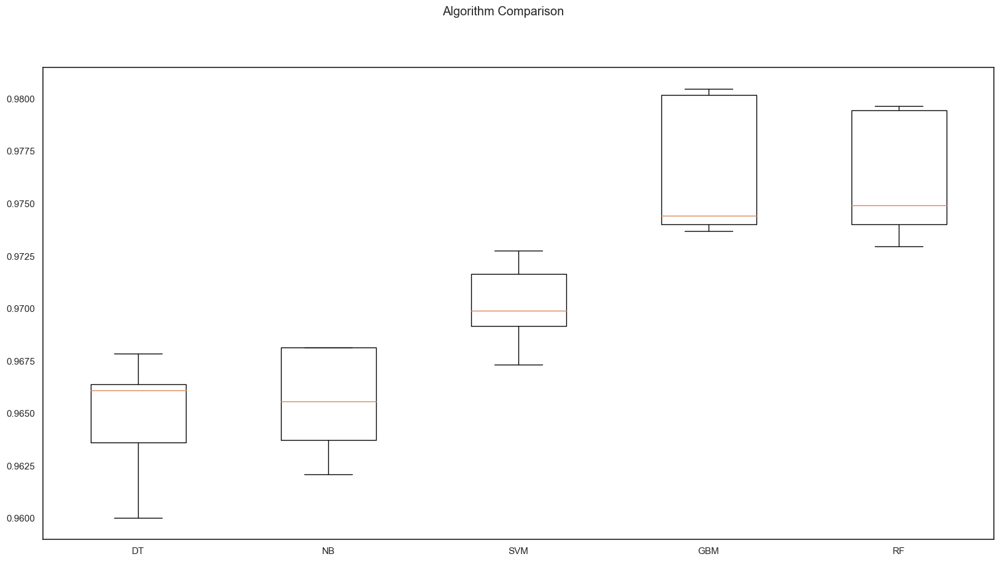

In [33]:
# Compare Algorithms' Performance
fig = plt.figure()
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()


In [34]:
#Model Evaluation of best performing model, by testing with
#independent/external test data set.
# Make predictions on validation/test dataset

models.append(('DT', DecisionTreeClassifier()))
models.append(('NB', GaussianNB()))
models.append(('SVM', SVC()))
models.append(('GBM', GradientBoostingClassifier()))
models.append(('RF', RandomForestClassifier()))
dt = DecisionTreeClassifier()
nb = GaussianNB()
gb = GradientBoostingClassifier()
rf = RandomForestClassifier()

best_model = rf
best_model.fit(x_train, y_train)
y_pred = best_model.predict(x_test)
print("Best Model Accuracy Score on Test Set:", accuracy_score(y_test, y_pred))

Best Model Accuracy Score on Test Set: 0.9750123294427092


In [35]:
#Model Performance Evaluation Metric 1 - Classification Report
print(classification_report(y_test, y_pred))


              precision    recall  f1-score   support

           0       0.97      0.96      0.97      2966
           1       0.98      0.98      0.98      2786
           2       0.98      0.97      0.98       597
           3       0.98      0.98      0.98      2846
           4       0.97      0.98      0.97      2971

    accuracy                           0.98     12166
   macro avg       0.98      0.98      0.98     12166
weighted avg       0.98      0.98      0.98     12166


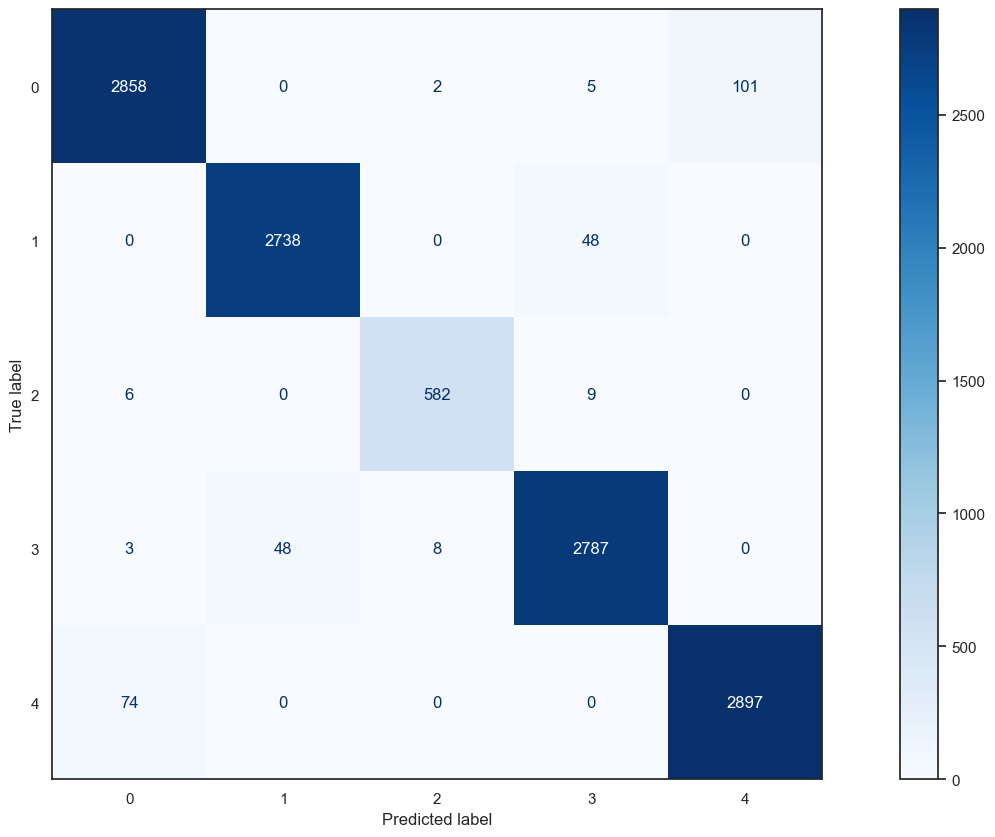

In [36]:
#Model Performance Evaluation Metric 2
#Confusion matrix
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')
plt.show()

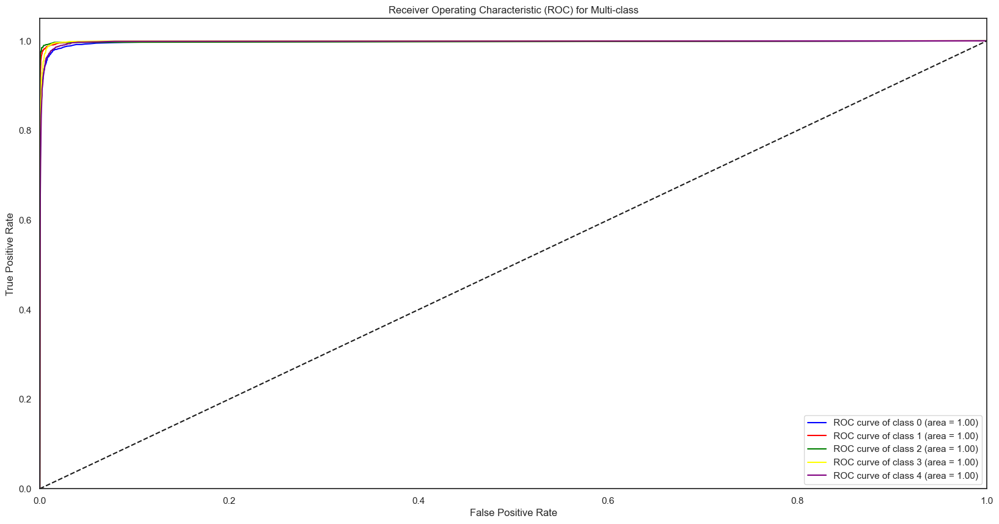

In [48]:
#Model Evaluation Metric 3- ROC-AUC curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve

best_model.fit(x_train, y_train)
n_classes = len(set(y_train))

fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    y_test_bin = pd.Series(y_test).map(lambda x: 1 if x == i else 0)
    y_score_bin = best_model.predict_proba(x_test)[:, i] 
    fpr[i], tpr[i], _ = roc_curve(y_test_bin, y_score_bin)
    roc_auc[i] = roc_auc_score(y_test_bin, y_score_bin)

plt.figure()
colors = ['blue', 'red', 'green', 'yellow', 'purple', 'cyan'] 
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, label='ROC curve of class {0} (area = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) for Multi-class')
plt.legend(loc="lower right")
plt.savefig('LOC_ROC')
plt.show()



In [53]:
#Model Evaluation Metric 4-prediction report
for x in range(len(y_pred)):
	print("Predicted: ", y_pred[x], "Actual: ", y_test[x], "Data: ", x_test[x],)

Predicted:  0 Actual:  0 Data:  (3309, 27265, 30757, 42736, 1687, 3309, 214, 3415, 3217, 5599, 3502, 2731, 42, 36, 3093, 253)
Predicted:  4 Actual:  4 Data:  (1965, 10422, 13424, 41209, 1106, 1965, 311, 1967, 4606, 2776, 4403, 3316, 44, 52, 3956, 234)
Predicted:  3 Actual:  3 Data:  (293, 14621, 29432, 10058, 2495, 293, 62, 408, 2572, 12041, 1895, 1358, 140, 38, 1365, 92)
Predicted:  0 Actual:  0 Data:  (4283, 28685, 29600, 53277, 1202, 4283, 122, 4494, 4251, 3138, 3931, 3192, 22, 37, 3767, 134)
Predicted:  0 Actual:  0 Data:  (2644, 23250, 29545, 30178, 1871, 2644, 245, 2708, 2792, 6936, 3554, 2487, 56, 36, 2753, 225)
Predicted:  3 Actual:  3 Data:  (3234, 29139, 39371, 26151, 2264, 3234, 130, 3411, 2254, 9066, 2747, 1857, 68, 26, 1950, 134)
Predicted:  4 Actual:  4 Data:  (1438, 4482, 6912, 38240, 860, 1438, 303, 1437, 4293, 1923, 4650, 3528, 46, 59, 4286, 255)
Predicted:  0 Actual:  0 Data:  (2731, 24531, 24756, 37703, 1660, 2731, 106, 2910, 2894, 5425, 3451, 2712, 49, 40, 3067, 114